# Seismic Classification Using Custom Deep Learning Algorithms

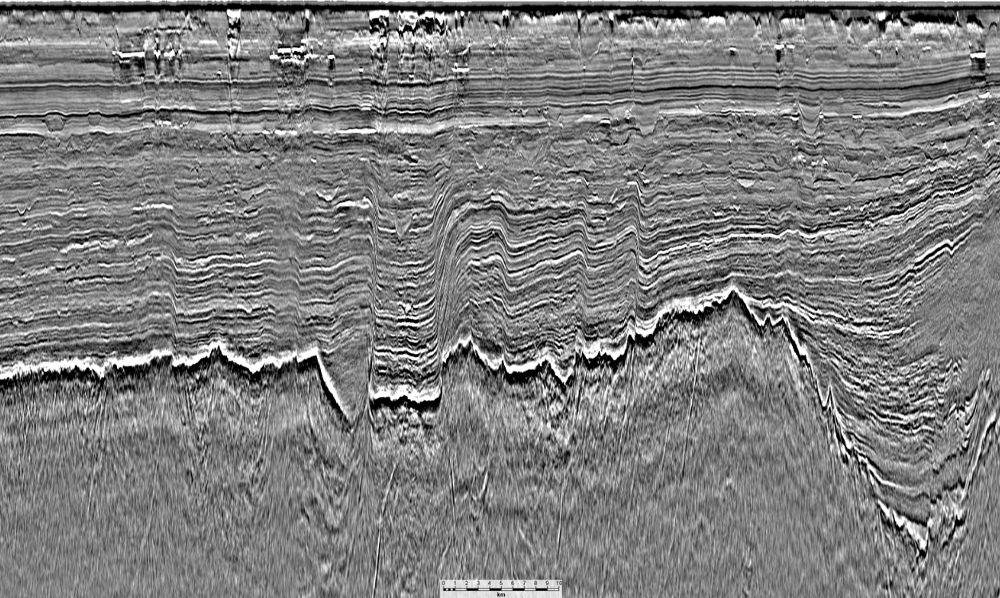

The project focuses on automated classification of seismic images using deep learning. Seismic data classification plays a critical role in geoscience, aiding in the interpretation of subsurface structures and the identification of potential resource deposits or hazards. The objective is to build robust computer vision models capable of accurately categorizing seismic images into distinct classes based on their features. The project leverages convolutional neural networks (CNNs), including a custom-designed CNN and a transfer learning approach with the VGG16 architecture, to achieve high classification accuracy.
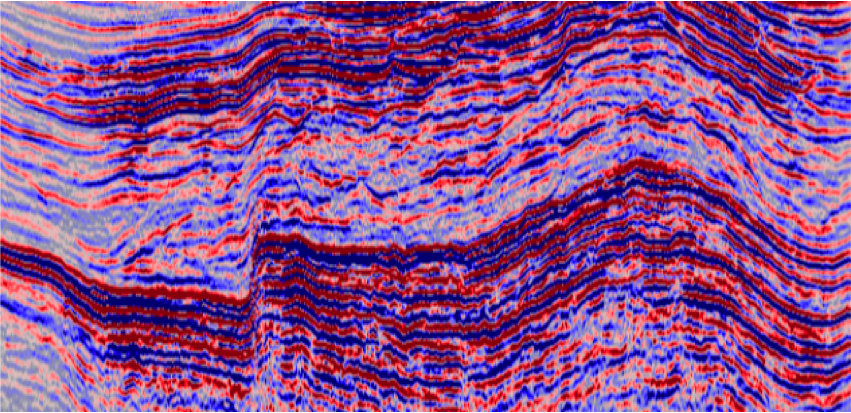
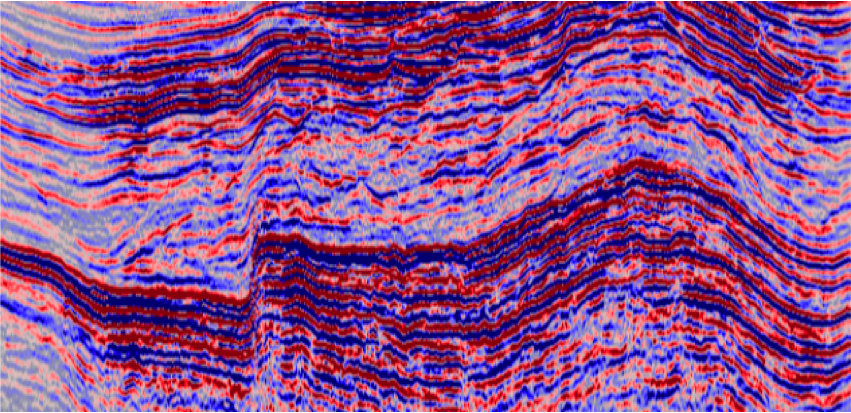
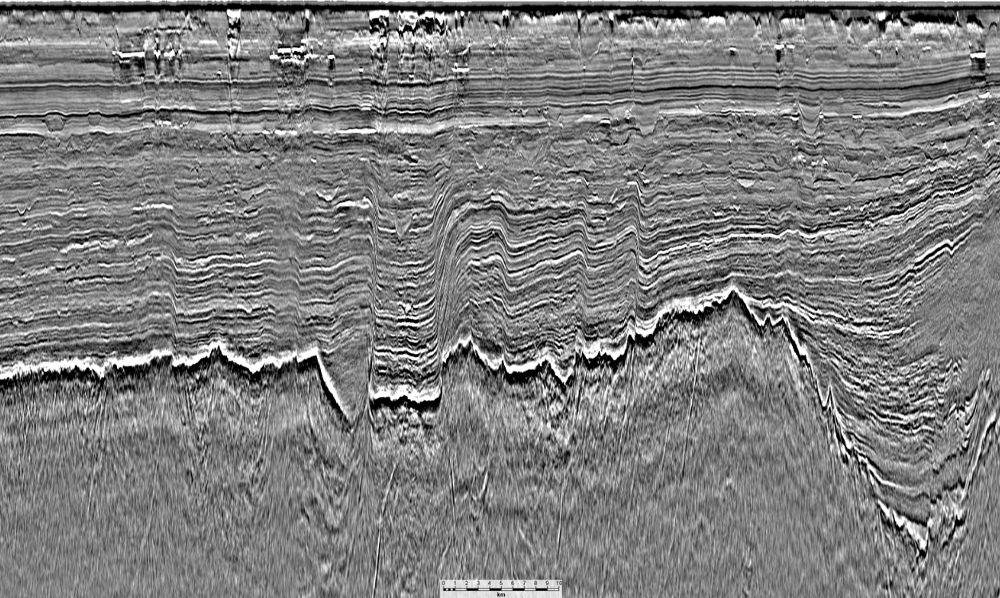

In [1]:
import numpy as np 
import pandas as pd 
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/seismic-classification-data/Seismic_data/validation/salt/2020-07-24 22_16_32-images (41) - Windows Photo Viewer.jpg
/kaggle/input/seismic-classification-data/Seismic_data/validation/salt/2020-07-24 22_17_36-images (45) - Windows Photo Viewer.jpg
/kaggle/input/seismic-classification-data/Seismic_data/validation/salt/2020-07-24 22_16_41-images (42) - Windows Photo Viewer.jpg
/kaggle/input/seismic-classification-data/Seismic_data/validation/salt/2020-07-24 22_16_11-images (39) - Windows Photo Viewer.jpg
/kaggle/input/seismic-classification-data/Seismic_data/validation/salt/2020-07-24 22_17_06-images (43) - Windows Photo Viewer.jpg
/kaggle/input/seismic-classification-data/Seismic_data/validation/salt/2020-07-24 22_19_18-images (51) - Windows Photo Viewer.jpg
/kaggle/input/seismic-classification-data/Seismic_data/validation/salt/2020-07-24 22_15_36-images (36) - Windows Photo Viewer.jpg
/kaggle/input/seismic-classification-data/Seismic_data/validation/salt/2020-07-24 22_16_53

# Data Description and Problem Statement

The dataset consists of seismic images organized into training, validation, and testing sets, with images separated into classes (e.g., different types of seismic patterns or geological formations). 

The primary goal is to train models that can:
* Learn hierarchical features from seismic images.
* Generalize well to unseen data, thereby providing reliable classifications.
* Ultimately assist geoscientists in rapid and accurate interpretation of seismic surveys.

In [78]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers, callbacks
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.models import Model
from collections import defaultdict
import hashlib
import warnings
warnings.simplefilter('ignore')

In [36]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  1


In [37]:
tf.random.set_seed(42)
np.random.seed(42)

base_dir = '/kaggle/input/seismic-classification-data/Seismic_data'
train_dir = os.path.join(base_dir, 'train')
valid_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')

# Exploratory Data Analysis (EDA)

Before model development, a thorough EDA was performed to understand the dataset's characteristics and potential challenges:

Class Distribution Analysis:
* Counted the number of images per class for training, validation, and test sets.
* Visualized class distributions using bar plots to detect class imbalances, which could influence model performance and necessitate strategies like data augmentation or class weighting.


Visual Inspection of Samples:
* Displayed a grid of sample images from each class to visually assess variability and quality.
* Analyzed pixel intensity distributions across different images to understand brightness, contrast, and other low-level image features.


Image Properties and Consistency Checks:
* Inspected shapes, pixel value ranges, and other properties of images to ensure consistent data formats.
* Identified potential issues like varying image resolutions or corrupted files that could hinder model training.


Duplicate Detection:
* Implemented a function to detect duplicate images using hash-based methods.
* Removing duplicates prevents redundant learning and biases.


Data Augmentation Effect Visualization:
* Examined how augmentation transforms images, comparing pre- and post-augmentation samples.
* Ensured that augmentation strategies (rotation, flipping, shifting) are realistic and preserve important features of seismic data.


In [52]:
def count_images(directory):
    class_counts = {}
    for class_name in os.listdir(directory):
        class_path = os.path.join(directory, class_name)
        if os.path.isdir(class_path):
            # Count number of files in class directory
            files = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]
            class_counts[class_name] = len(files)
    return class_counts

In [53]:
train_counts = count_images(train_dir)
valid_counts = count_images(valid_dir)
test_counts  = count_images(test_dir)

print("Training set class distribution:", train_counts)
print("Validation set class distribution:", valid_counts)
print("Test set class distribution:", test_counts)

Training set class distribution: {'salt': 72, 'fault': 74, 'anticline': 60, 'syncline': 32}
Validation set class distribution: {'salt': 15, 'fault': 15, 'anticline': 13, 'syncline': 7}
Test set class distribution: {'salt': 18, 'fault': 17, 'anticline': 15, 'syncline': 8}


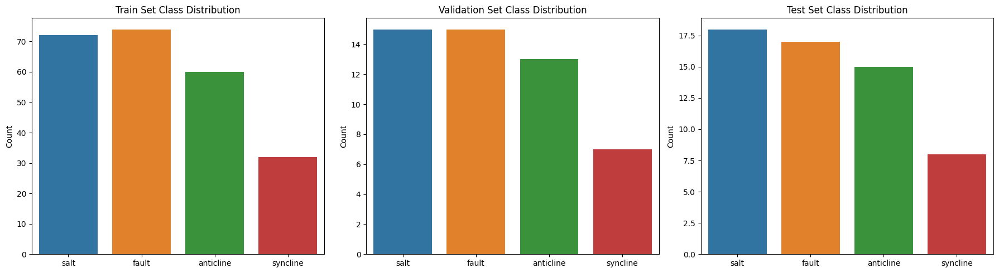

In [58]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

sns.barplot(x=list(train_counts.keys()), y=list(train_counts.values()), ax=axes[0])
axes[0].set_title("Train Set Class Distribution")
axes[0].set_ylabel("Count")

sns.barplot(x=list(valid_counts.keys()), y=list(valid_counts.values()), ax=axes[1])
axes[1].set_title("Validation Set Class Distribution")
axes[1].set_ylabel("Count")

sns.barplot(x=list(test_counts.keys()), y=list(test_counts.values()), ax=axes[2])
axes[2].set_title("Test Set Class Distribution")
axes[2].set_ylabel("Count")

plt.tight_layout()
plt.show()

In [59]:
def plot_sample_images(data_dir, class_names, samples_per_class=3):
    plt.figure(figsize=(samples_per_class*3, len(class_names)*3))
    i = 0
    for class_name in class_names:
        class_path = os.path.join(data_dir, class_name)
        image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        sample_files = image_files[:samples_per_class]
        for img_file in sample_files:
            img_path = os.path.join(class_path, img_file)
            img = image.load_img(img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
            ax = plt.subplot(len(class_names), samples_per_class, i+1)
            plt.imshow(img)
            plt.title(f"{class_name}")
            plt.axis('off')
            i += 1
    plt.tight_layout()
    plt.show()

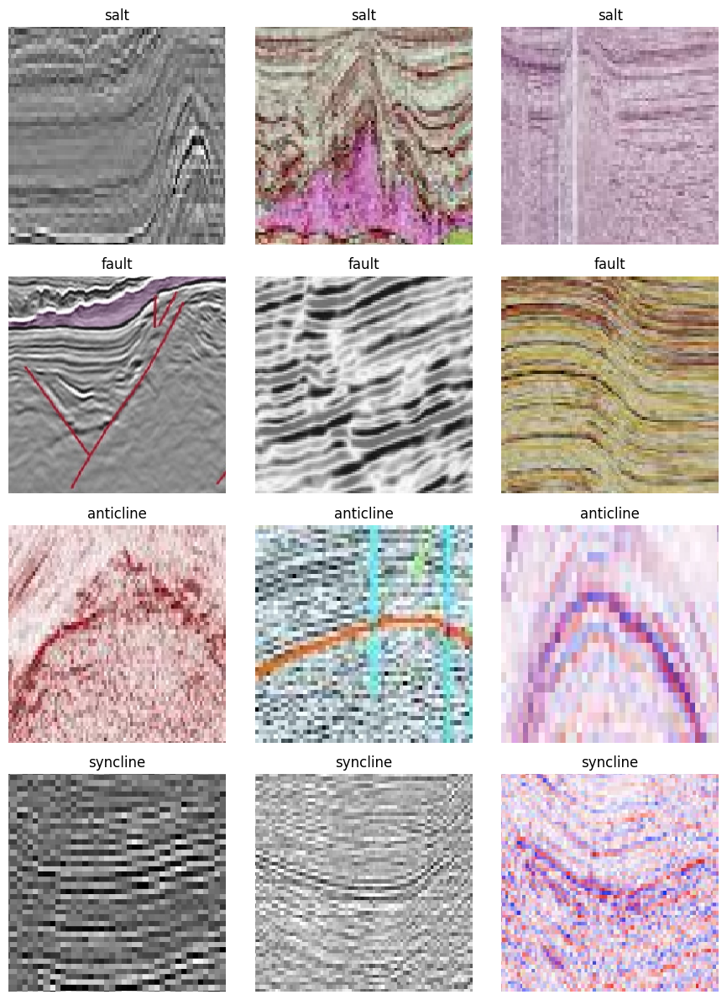

In [60]:
class_names = list(train_counts.keys())
plot_sample_images(train_dir, class_names)

In [61]:
def inspect_images_properties(data_dir, class_names, samples=5):
    for class_name in class_names:
        class_path = os.path.join(data_dir, class_name)
        image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        print(f"\nClass: {class_name}")
        for img_file in image_files[:samples]:
            img_path = os.path.join(class_path, img_file)
            img = image.load_img(img_path)  # load original size
            img_array = image.img_to_array(img)
            print(f"- {img_file}: shape={img_array.shape}, min={img_array.min()}, max={img_array.max()}, mean={img_array.mean():.2f}")

inspect_images_properties(train_dir, class_names)


Class: salt
- 2020-07-24 22_14_05-images (30) - Windows Photo Viewer.jpg: shape=(112, 228, 3), min=0.0, max=248.0, mean=129.24
- 2020-07-24 21_59_50-download (2) - Windows Photo Viewer.jpg: shape=(230, 256, 3), min=0.0, max=253.0, mean=149.68
- 2020-07-24 22_04_47-images (2) - Windows Photo Viewer.jpg: shape=(173, 179, 3), min=61.0, max=247.0, mean=178.30
- 2020-07-24 22_05_27-images (4) - Windows Photo Viewer.jpg: shape=(539, 366, 3), min=0.0, max=255.0, mean=126.82
- 2020-07-24 22_12_19-images (24) - Windows Photo Viewer.jpg: shape=(307, 296, 3), min=0.0, max=255.0, mean=131.08

Class: fault
- 2020-07-24 17_29_56-190917-web-geoexpro-presalt-petroleum-systems-in-atlantic-basins--fig3-860px - W.jpg: shape=(234, 181, 3), min=7.0, max=255.0, mean=138.23
- 2020-07-24 17_32_56-seismic_a3_greyscale - Windows Photo Viewer.jpg: shape=(89, 98, 3), min=18.0, max=255.0, mean=165.09
- 2020-07-24 17_52_48-images (1) - Windows Photo Viewer.jpg: shape=(190, 207, 3), min=0.0, max=233.0, mean=144.13


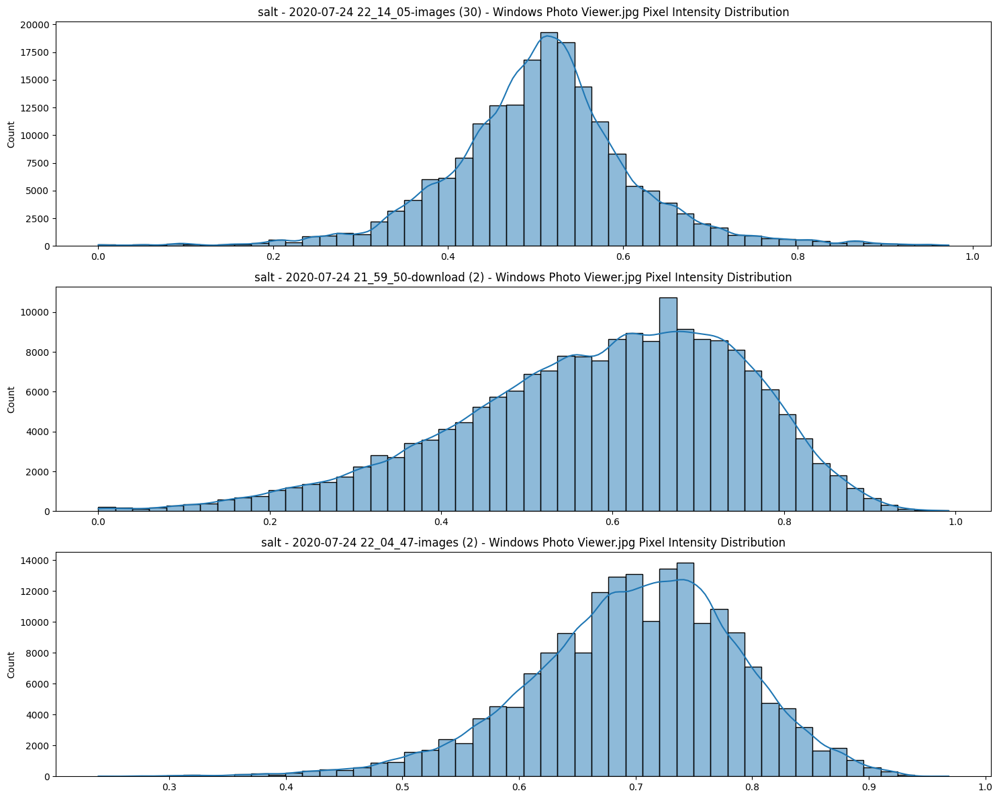

In [62]:
def plot_pixel_distribution(data_dir, class_name, num_samples=3):
    class_path = os.path.join(data_dir, class_name)
    image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    plt.figure(figsize=(15, 4 * num_samples))
    for i, img_file in enumerate(image_files[:num_samples]):
        img_path = os.path.join(class_path, img_file)
        img = image.load_img(img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
        img_array = image.img_to_array(img) / 255.0  # normalize
        # Flatten pixel values across channels
        pixels = img_array.flatten()
        plt.subplot(num_samples, 1, i+1)
        sns.histplot(pixels, bins=50, kde=True)
        plt.title(f"{class_name} - {img_file} Pixel Intensity Distribution")
    plt.tight_layout()
    plt.show()

plot_pixel_distribution(train_dir, class_names[0])

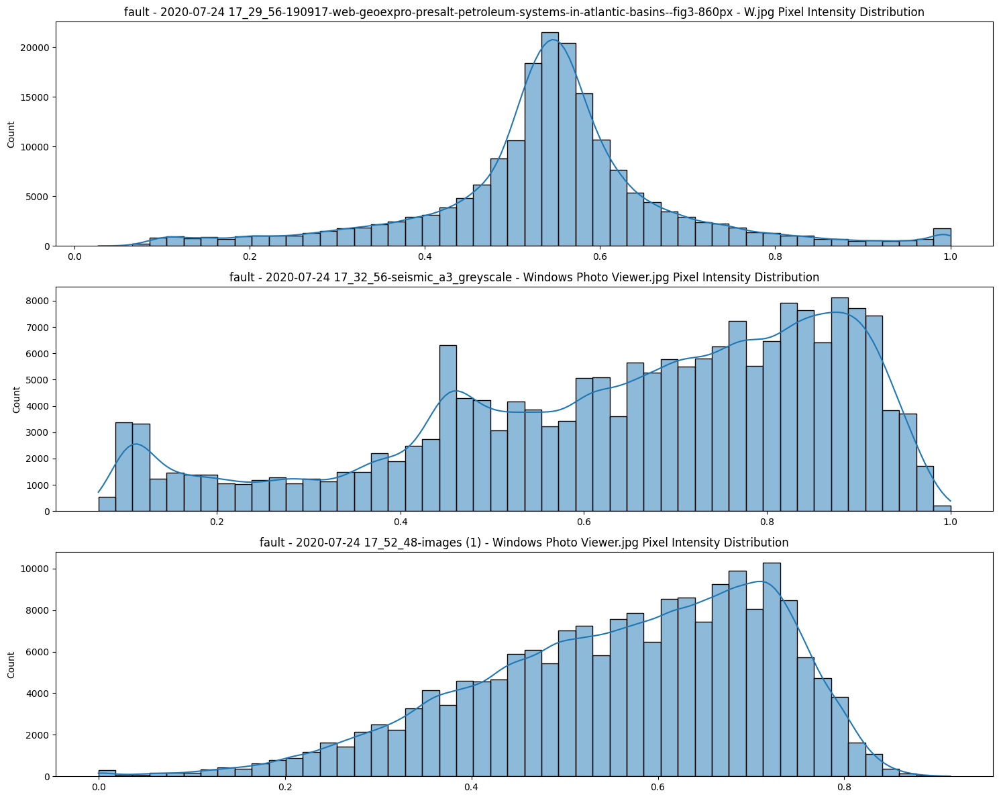

In [63]:
def plot_pixel_distribution(data_dir, class_name, num_samples=3):
    class_path = os.path.join(data_dir, class_name)
    image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    plt.figure(figsize=(15, 4 * num_samples))
    for i, img_file in enumerate(image_files[:num_samples]):
        img_path = os.path.join(class_path, img_file)
        img = image.load_img(img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
        img_array = image.img_to_array(img) / 255.0  # normalize
        # Flatten pixel values across channels
        pixels = img_array.flatten()
        plt.subplot(num_samples, 1, i+1)
        sns.histplot(pixels, bins=50, kde=True)
        plt.title(f"{class_name} - {img_file} Pixel Intensity Distribution")
    plt.tight_layout()
    plt.show()

plot_pixel_distribution(train_dir, class_names[1])

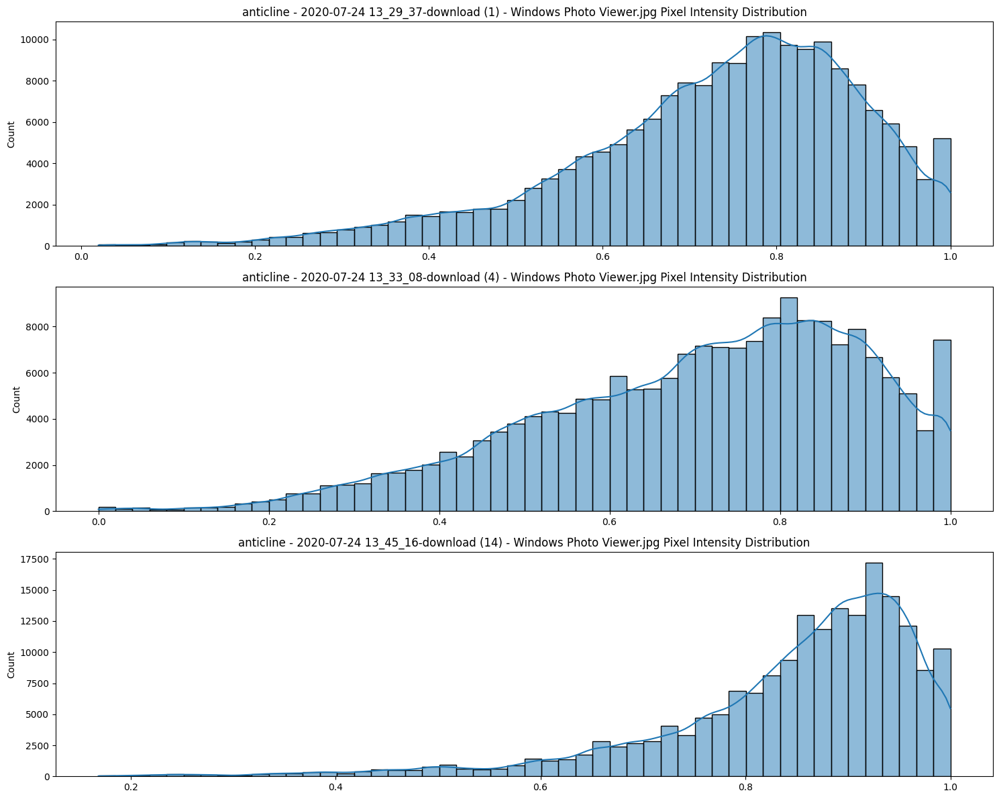

In [64]:
def plot_pixel_distribution(data_dir, class_name, num_samples=3):
    class_path = os.path.join(data_dir, class_name)
    image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    plt.figure(figsize=(15, 4 * num_samples))
    for i, img_file in enumerate(image_files[:num_samples]):
        img_path = os.path.join(class_path, img_file)
        img = image.load_img(img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
        img_array = image.img_to_array(img) / 255.0  # normalize
        # Flatten pixel values across channels
        pixels = img_array.flatten()
        plt.subplot(num_samples, 1, i+1)
        sns.histplot(pixels, bins=50, kde=True)
        plt.title(f"{class_name} - {img_file} Pixel Intensity Distribution")
    plt.tight_layout()
    plt.show()

plot_pixel_distribution(train_dir, class_names[2])

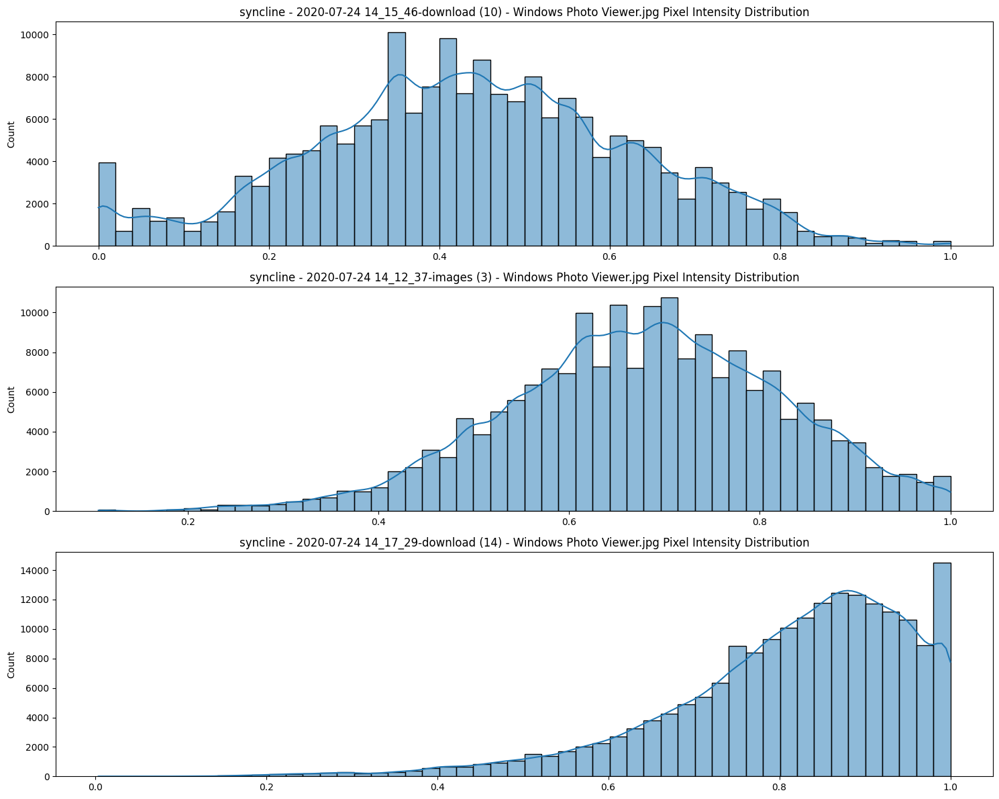

In [65]:
def plot_pixel_distribution(data_dir, class_name, num_samples=3):
    class_path = os.path.join(data_dir, class_name)
    image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    plt.figure(figsize=(15, 4 * num_samples))
    for i, img_file in enumerate(image_files[:num_samples]):
        img_path = os.path.join(class_path, img_file)
        img = image.load_img(img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
        img_array = image.img_to_array(img) / 255.0  # normalize
        # Flatten pixel values across channels
        pixels = img_array.flatten()
        plt.subplot(num_samples, 1, i+1)
        sns.histplot(pixels, bins=50, kde=True)
        plt.title(f"{class_name} - {img_file} Pixel Intensity Distribution")
    plt.tight_layout()
    plt.show()

plot_pixel_distribution(train_dir, class_names[3])

In [66]:
def file_hash(filepath, block_size=65536):
    hasher = hashlib.md5()
    with open(filepath, 'rb') as f:
        buf = f.read(block_size)
        while len(buf) > 0:
            hasher.update(buf)
            buf = f.read(block_size)
    return hasher.hexdigest()

In [71]:
def find_duplicates(directory):
    hashes = defaultdict(list)
    for root, _, files in os.walk(directory):
        for fname in files:
            if fname.lower().endswith(('.png', '.jpg', '.jpeg')):
                fpath = os.path.join(root, fname)
                h = file_hash(fpath)
                hashes[h].append(fpath)
    duplicates = {h: paths for h, paths in hashes.items() if len(paths) > 1}
    return duplicates

duplicates_train = find_duplicates(train_dir)
print(f"Found {len(duplicates_train)} groups of duplicate images in training set.")
for h, paths in duplicates_train.items():
    print(f"Hash: {h} -> Files: {paths}")

Found 0 groups of duplicate images in training set.


In [72]:
def check_image_consistency(directory):
    shapes = defaultdict(int)
    for root, _, files in os.walk(directory):
        for fname in files:
            if fname.lower().endswith(('.png', '.jpg', '.jpeg')):
                fpath = os.path.join(root, fname)
                img = image.load_img(fpath)
                img_array = image.img_to_array(img)
                shapes[img_array.shape] += 1
    return shapes

consistency_train = check_image_consistency(train_dir)
print("Image shape distribution in training set:", dict(consistency_train))

Image shape distribution in training set: {(112, 228, 3): 1, (230, 256, 3): 1, (173, 179, 3): 1, (539, 366, 3): 1, (307, 296, 3): 1, (468, 852, 3): 1, (427, 618, 3): 1, (348, 562, 3): 1, (191, 312, 3): 1, (247, 217, 3): 1, (367, 444, 3): 1, (286, 357, 3): 1, (346, 237, 3): 1, (296, 670, 3): 1, (190, 414, 3): 1, (130, 316, 3): 1, (532, 672, 3): 1, (302, 209, 3): 1, (291, 412, 3): 1, (344, 464, 3): 1, (305, 658, 3): 1, (280, 385, 3): 1, (188, 294, 3): 1, (110, 226, 3): 1, (298, 361, 3): 1, (533, 497, 3): 1, (509, 292, 3): 1, (173, 235, 3): 1, (180, 300, 3): 1, (251, 223, 3): 1, (287, 277, 3): 1, (300, 355, 3): 1, (360, 293, 3): 1, (310, 594, 3): 1, (113, 224, 3): 1, (180, 262, 3): 1, (192, 435, 3): 1, (323, 323, 3): 1, (399, 284, 3): 1, (349, 344, 3): 1, (307, 312, 3): 1, (351, 745, 3): 1, (334, 327, 3): 1, (234, 400, 3): 1, (256, 219, 3): 1, (327, 298, 3): 1, (269, 342, 3): 1, (108, 227, 3): 1, (379, 425, 3): 1, (350, 264, 3): 1, (160, 208, 3): 1, (289, 535, 3): 1, (255, 358, 3): 1, (11

In [80]:
augmentation_gen = image.ImageDataGenerator(
    rescale=1./255,
    rotation_range=5,
    horizontal_flip=True,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.1,
    fill_mode="nearest"
)

In [81]:
def display_augmentation_effect(data_dir, class_name, num_samples=3):
    class_path = os.path.join(data_dir, class_name)
    image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    sample_files = image_files[:num_samples]
    
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5 * num_samples))
    
    for i, img_file in enumerate(sample_files):
        img_path = os.path.join(class_path, img_file)
        orig_img = image.load_img(img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
        orig_array = image.img_to_array(orig_img) / 255.0
        
        img_expanded = np.expand_dims(orig_array, axis=0)
        
        aug_iter = augmentation_gen.flow(img_expanded, batch_size=1)
        augmented = next(aug_iter)[0]
        
        axes[i, 0].imshow(orig_array)
        axes[i, 0].set_title("Original")
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(augmented)
        axes[i, 1].set_title("Augmented")
        axes[i, 1].axis('off')
        
        difference = np.abs(orig_array - augmented)
        axes[i, 2].imshow(difference)
        axes[i, 2].set_title("Difference")
        axes[i, 2].axis('off')
        
    plt.suptitle(f"Augmentation Effects for Class: {class_name}")
    plt.tight_layout()
    plt.show()

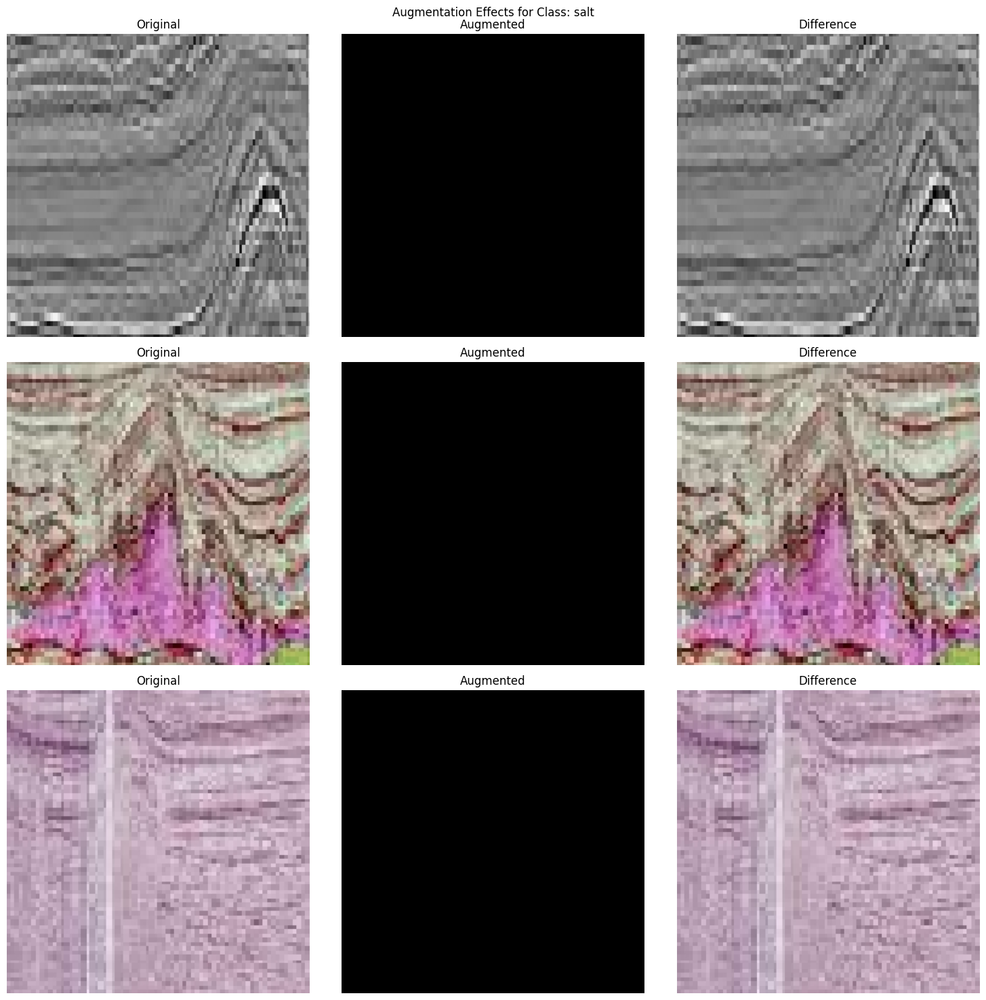

In [82]:
sample_class = next(iter(os.listdir(train_dir)))
display_augmentation_effect(train_dir, sample_class)

# Model Building

Two modeling strategies were employed:

Custom CNN Model:
* Architecture: A straightforward CNN with two convolutional layers, pooling, dropout, and fully connected layers.
* Activation & Optimization: Utilized ReLU activations and the Adam optimizer due to their effectiveness in similar image classification tasks.
* Rationale: Starting with a simpler, custom model allows for baseline performance estimation and understanding of how well a network can learn seismic features from scratch.


Transfer Learning with VGG16:
* Architecture: Leveraged the VGG16 model pre-trained on ImageNet as a feature extractor. The convolutional base was frozen to retain learned features, and a custom classifier head was added on top.
* Advantages: Transfer learning harnesses robust, pre-learned filters for low-level and mid-level image features, accelerating training and potentially improving performance with limited seismic data.
* Fine-Tuning: While the base was initially frozen, a future step might involve unfreezing some layers to fine-tune on seismic-specific patterns.


In [38]:
IMG_HEIGHT, IMG_WIDTH = 250, 250
BATCH_SIZE = 32 
LEARNING_RATE = 1e-3
EPOCHS = 30
num_classes = 4

In [39]:
# Data generators
train_datagen = image.ImageDataGenerator(
    rescale=1./255,
    rotation_range=5,
    horizontal_flip=True,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.1,
    fill_mode="nearest"
)

test_datagen = image.ImageDataGenerator(rescale=1./255)

train_gen = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    seed=42
)

validation_gen = test_datagen.flow_from_directory(
    valid_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    seed=42
)

test_gen = test_datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

Found 238 images belonging to 4 classes.
Found 50 images belonging to 4 classes.
Found 58 images belonging to 4 classes.


In [40]:
def get_callbacks():
    checkpoint_cb = callbacks.ModelCheckpoint(
        "best_model_temp.keras", save_best_only=True, monitor='val_accuracy', mode='max', verbose=1
    )
    earlystop_cb = callbacks.EarlyStopping(
        monitor='val_loss', patience=5, restore_best_weights=True, verbose=1
    )
    reduce_lr_cb = callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1
    )
    return [checkpoint_cb, earlystop_cb, reduce_lr_cb]

In [33]:
def get_callbacks():
    checkpoint_cb = callbacks.ModelCheckpoint(
        "best_model_temp.keras", save_best_only=True, monitor='val_accuracy', mode='max', verbose=0
    )
    earlystop_cb = callbacks.EarlyStopping(
        monitor='val_loss', patience=5, restore_best_weights=True, verbose=0
    )
    reduce_lr_cb = callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=0
    )
    return [checkpoint_cb, earlystop_cb, reduce_lr_cb]

In [41]:
def plot_history(hist, model_name=''):
    acc = hist.history['accuracy']
    val_acc = hist.history['val_accuracy']
    loss = hist.history['loss']
    val_loss = hist.history['val_loss']
    epochs_range = range(len(acc))

    plt.figure(figsize=(14, 5))

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Train Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.title(f'{model_name} Accuracy')
    plt.legend(loc='lower right')

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Train Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.title(f'{model_name} Loss')
    plt.legend(loc='upper right')

    plt.show()

# Custom CNN Model

In [42]:
def build_custom_cnn(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3), num_classes=4):
    model = models.Sequential()
    model.add(layers.Input(shape=input_shape))
    
    model.add(layers.Conv2D(32, (3, 3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D())
    model.add(layers.Dropout(0.25))
    
    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D())
    model.add(layers.Dropout(0.25))
    
    model.add(layers.Flatten())
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(num_classes, activation='softmax'))
    
    model.compile(optimizer=optimizers.Adam(learning_rate=LEARNING_RATE),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

In [43]:
print("Building and training custom CNN...")
custom_model = build_custom_cnn(num_classes=num_classes)
custom_model.summary()

custom_callbacks = get_callbacks()
custom_history = custom_model.fit(
    train_gen,
    epochs=EPOCHS,
    validation_data=validation_gen,
    callbacks=custom_callbacks,
    verbose=1
)

Building and training custom CNN...


Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_98 (Conv2D)                   │ (None, 250, 250, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_57 (MaxPooling2D)      │ (None, 125, 125, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_78 (Dropout)                 │ (None, 125, 125, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_99 (Conv2D)                   │ (None, 125, 125, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_58 (MaxPooling2D)      │ (None, 62, 62, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_79 (Dropout)                 │ (None, 62, 62, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_27 (Flatten)                 │ (None, 246016)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_57 (Dense)                     │ (None, 128)                 │      31,490,176 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_80 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_58 (Dense)                     │ (None, 4)                   │             516 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 31,510,084 (120.20 MB)

 Trainable params: 31,510,084 (120.20 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 660ms/step - accuracy: 0.3434 - loss: 16.6989
Epoch 1: val_accuracy improved from -inf to 0.30000, saving model to best_model_temp.keras
8/8 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step - accuracy: 0.3426 - loss: 16.6242 - val_accuracy: 0.3000 - val_loss: 1.5667 - learning_rate: 0.0010
Epoch 2/30
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.2318 - loss: 3.6332
Epoch 2: val_accuracy did not improve from 0.30000
8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 89ms/step - accuracy: 0.2363 - loss: 3.3530 - val_accuracy: 0.3000 - val_loss: 1.3867 - learning_rate: 0.0010
Epoch 3/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.3160 - loss: 1.3709
Epoch 3: val_accuracy improved from 0.30000 to 0.42000, saving model to best_model_temp.keras
8/8 ━━━━━━━━━━━━━━━━━━━━ 6s 349ms/step - accuracy: 0.3140 - loss: 1.3719 - val_accuracy: 0.4200 - val_loss: 1.3807 - learning_rate: 0.0010
Epoch 4/30
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.3106 - loss: 1.3530
Epoch 4: val_ac

In [44]:
custom_model.load_weights("best_model_temp.keras")
test_loss, test_acc = custom_model.evaluate(test_gen, verbose=1)
print(f"Custom CNN - Test Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.4f}")

2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - accuracy: 0.3017 - loss: 1.3752  
Custom CNN - Test Loss: 1.3802, Test Accuracy: 0.3276


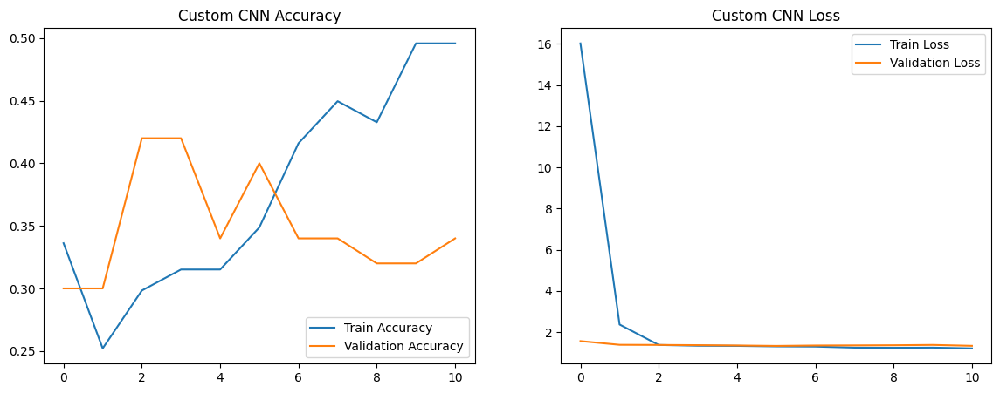

In [45]:
plot_history(custom_history, model_name='Custom CNN')

# Custom VGG16 Model

In [46]:
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3))

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [47]:
# Freeze the base model
for layer in base_model.layers:
    layer.trainable = False

x = base_model.output
x = Flatten()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, activation='softmax')(x)

In [48]:
pretrained_model = Model(inputs=base_model.input, outputs=predictions)
pretrained_model.compile(
    optimizer=optimizers.Adam(learning_rate=LEARNING_RATE),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

pretrained_model.summary()

Model: "functional_285"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_28 (InputLayer)          │ (None, 250, 250, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 250, 250, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 250, 250, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 125, 125, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 125, 125, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 125, 125, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 62, 62, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 62, 62, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 62, 62, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 62, 62, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 31, 31, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 31, 31, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 31, 31, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 31, 31, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 15, 15, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 15, 15, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 15, 15, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 15, 15, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_28 (Flatten)                 │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_59 (Dense)                     │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 17,926,596 (68.38 MB)

 Trainable params: 3,211,908 (12.25 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [49]:
pretrained_callbacks = get_callbacks()
pretrained_history = pretrained_model.fit(
    train_gen,
    epochs=EPOCHS,
    validation_data=validation_gen,
    callbacks=pretrained_callbacks,
    verbose=1
)

Epoch 1/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.2576 - loss: 3.1585
Epoch 1: val_accuracy improved from -inf to 0.42000, saving model to best_model_temp.keras
8/8 ━━━━━━━━━━━━━━━━━━━━ 27s 2s/step - accuracy: 0.2631 - loss: 3.1490 - val_accuracy: 0.4200 - val_loss: 1.1998 - learning_rate: 0.0010
Epoch 2/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.5168 - loss: 1.3878
Epoch 2: val_accuracy improved from 0.42000 to 0.50000, saving model to best_model_temp.keras
8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 187ms/step - accuracy: 0.5215 - loss: 1.3771 - val_accuracy: 0.5000 - val_loss: 1.1068 - learning_rate: 0.0010
Epoch 3/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.5854 - loss: 0.9891
Epoch 3: val_accuracy improved from 0.50000 to 0.58000, saving model to best_model_temp.keras
8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 188ms/step - accuracy: 0.5890 - loss: 0.9839 - val_accuracy: 0.5800 - val_loss: 0.9837 - learning_rate: 0.0010
Epoch 4/30
7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy

In [50]:
pretrained_model.load_weights("best_model_temp.keras")
test_loss, test_acc = pretrained_model.evaluate(test_gen, verbose=1)
print(f"Pretrained VGG16 - Test Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.4f}")

2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step - accuracy: 0.6128 - loss: 1.0513  
Pretrained VGG16 - Test Loss: 1.0099, Test Accuracy: 0.6379


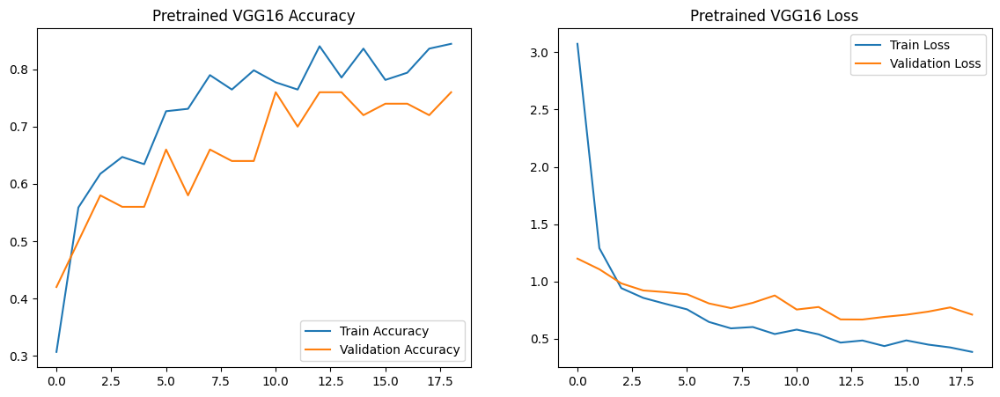

In [51]:
plot_history(pretrained_history, model_name='Pretrained VGG16')

# Results and Insights


* The Custom CNN provided a baseline performance and demonstrated how well a simpler model could learn features specific to seismic images.
* The Pretrained VGG16 model, enhanced with a custom classification head, leveraged transfer learning and generally improved classification accuracy due to robust feature extraction from a larger, diverse dataset (ImageNet).
